<h1>Stereo Vision</h1>
<img src='./stereo.png'/>

<p>
In this workshop, you will learn:

<ul>
  <li>How to create a disparity map</li>
  <li>How to use 3D Projections to estimate 3D coordinates of obstacles</li>
  <li>How to create a 3D Point Cloud from Stereo Images</li>
</ul>

For that, we will do it in several parts:
<ol>
<li>
<b>Load the images.</b>

There are 4 images: 3 coming from the KITTI VISION BENCHMARK SUITE and 1 coming from my own Stereo Camera.
</li>
<li>
<b>Create a Disparity Map</b>

Use the algorithms we've learned such as Stereo BM and Stereo SGBM to try and build a disparity map!
</li>
<li>
<b>Get the Calibration Parameters</b>

Use the camera calibration workshop or the calibration files provided to load the matrices.
</li>
<li>
<b>Compute the Depth Map</b>

Use these matrices and the disparity to build a depth map.
</li>
<li>
<b>Find Obstacles in 3D</b>

Use an obstacle detection algorithm and mix it with the depth map to get the distances of each obstacle.
</li>
<li>
<b>Build a 3D Point Cloud</b>

Something we can also do is to build a 3D Point Cloud! I'll show you how!
</li>
</ol>
</p>

In [ ]:
!wget https://stereo-vision.s3.eu-west-3.amazonaws.com/stereo_vision_data.zip

In [ ]:
!jar xf stereo_vision_data.zip
# This file will download everything we need (except for YOLOv4 weights, that will be downloaded separately)

In [1]:
import os
os.chdir("stereo_vision_data")

<h3><b>Additional Libraries</b></h3>

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import Image
from ipywidgets import interact, interactive, fixed
import glob

<h3><b>Step 1 - Load image data</b></h3>

There are 6 images


Text(0.5, 1.0, 'Image Right')

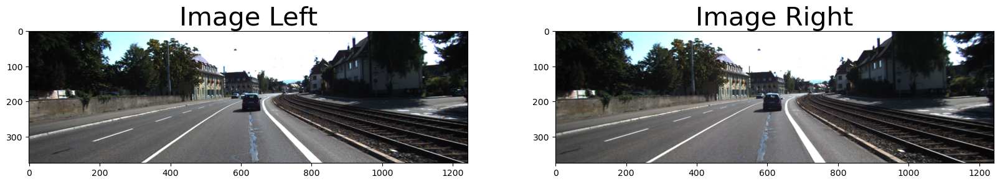

In [3]:
images_L = sorted(glob.glob("data/left/*.png"))
images_R = sorted(glob.glob("data/right/*.png"))
labels = sorted(glob.glob("data/labels/*.txt"))
calib_files = sorted(glob.glob("data/calib/*.txt"))

print("There are",len(images_L),"images")
index = 2
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(cv2.cvtColor(cv2.imread(images_L[index]), cv2.COLOR_BGR2RGB))
ax1.set_title('Image Left', fontsize=30)
ax2.imshow(cv2.cvtColor(cv2.imread(images_R[index]), cv2.COLOR_BGR2RGB))
ax2.set_title('Image Right', fontsize=30)

<h3><b>Step 2 - Calculate the Disparity Map</b></h3>
<img src='./step2.png'/>

<h3><b>Compute And Display the Disparity</b></h3>

In [4]:
def compute_disparity(image, img_pair, num_disparities=6*16, block_size=11, window_size=6, matcher="stereo_sgbm", show_disparity=True):
    """
    Create a Stereo BM or Stereo SGBM Matcher
    Compute the Matching
    Display the disparity image
    Return it
    """
    if matcher == "stereo_bm":
        new_image = cv2.StereoBM_create(numDisparities=num_disparities,blockSize=block_size)
    elif matcher == "stereo_sgbm":
        '''
        Understand parameters: https://docs.opencv.org/3.4/d2/d85/classcv_1_1StereoSGBM.html
        '''
        new_image = cv2.StereoSGBM_create(minDisparity=0, numDisparities=num_disparities, blockSize=block_size, P1=8 * 3 * window_size ** 2,
            P2=32 * 3 * window_size ** 2, mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY)

    new_image = new_image.compute(image, img_pair).astype(np.float32)/16
    if (show_disparity==True):
        plt.figure(figsize = (40,20))
        plt.imshow(new_image, cmap="cividis")
        plt.show()
    return new_image

In [5]:
"""
NUM_DISPARITIES:
the disparity search range.
For each pixel algorithm will find the best disparity from 0 (default minimum disparity) to numDisparities.
The search range can then be shifted by changing the minimum disparity.
--> The value is always greater than zero. In the current implementation, this parameter must be divisible by 16.
"""
num_d = (0,512,16)

"""
BLOCK SIZE: the linear size of the blocks compared by the algorithm.
Matched block size. It must be an odd number >=1 .
Normally, it should be somewhere in the 3..11 range.
--> Larger block size implies smoother, though less accurate disparity map.
--> Smaller block size gives more detailed disparity map, but there is higher chance for algorithm to find a wrong correspondence.
"""
b_s = (1,19,2)

"""
WINDOW SIZE:
Default 3; 5; 7 for SGBM reduced size image; 15 for SGBM full size image (1300px and above); 5 Works nicely
"""
window_s = (1,13,2)

"""
MIN DISPARITY
min: Minimum possible disparity value.
Normally, it is zero but sometimes rectification algorithms can shift images, so this parameter needs to be adjusted accordingly.
max: has to be dividable by 16 f. E. HH 192, 256, default:
#
"""

'\nMIN DISPARITY\nmin: Minimum possible disparity value.\nNormally, it is zero but sometimes rectification algorithms can shift images, so this parameter needs to be adjusted accordingly.\nmax: has to be dividable by 16 f. E. HH 192, 256, default:\n#\n'

In [6]:
#Reading the Left Images
img_left = cv2.imread(images_L[index]) #OpenCV reads in BGR
img_left_gray = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
# Reading the right Images
img_right = cv2.imread(images_R[index]) #OpenCV reads in BGR
img_right_gray = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)

In [7]:
disparity_left = interactive(compute_disparity, image=fixed(img_left_gray), img_pair = fixed(img_right_gray), num_disparities=num_d, block_size=b_s, window_size=window_s, matcher=["stereo_sgbm", "stereo_bm"])
display(disparity_left)

interactive(children=(IntSlider(value=96, description='num_disparities', max=512, step=16), IntSlider(value=11…

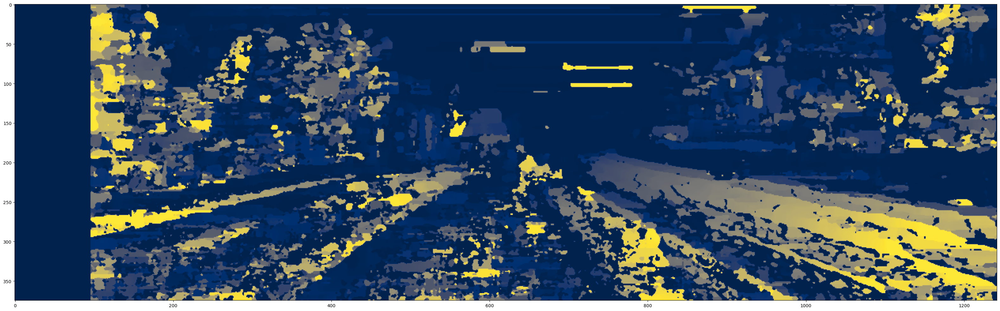

In [8]:
disparity_right = compute_disparity(img_right_gray, img_pair=img_left_gray, num_disparities=disparity_left.kwargs["num_disparities"], block_size=disparity_left.kwargs["block_size"], window_size=disparity_left.kwargs["window_size"], matcher=disparity_left.kwargs["matcher"])
disparity_left = disparity_left.result

Text(0.5, 1.0, 'Disparity Right')

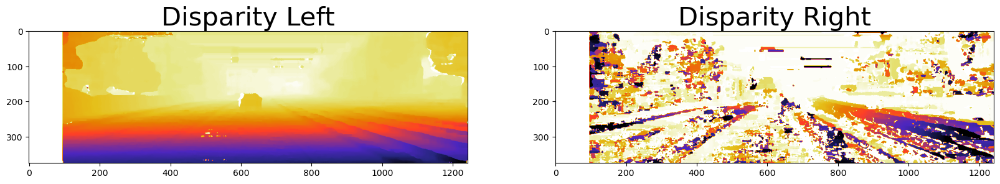

In [9]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(disparity_left,  cmap="CMRmap_r") # or CMRmap_r
ax1.set_title('Disparity Left', fontsize=30)
ax2.imshow(disparity_right, cmap="CMRmap_r")
ax2.set_title('Disparity Right', fontsize=30)

#cv2.imwrite("output/disparity.png",disparity_left)

<h3><b>Analysis, what is a disparity map?</b></h3>

[[ 8.      8.      8.     ...  3.3125  3.25    3.1875]
 [ 8.      8.      8.     ...  3.3125  3.25    3.1875]
 [ 8.      8.      8.     ...  3.3125  3.25    3.1875]
 ...
 [38.875  38.8125 38.8125 ... 40.8125 40.8125 40.75  ]
 [39.     38.9375 38.9375 ... 41.     41.     41.0625]
 [39.0625 39.     39.     ... 41.25   41.3125 41.375 ]]


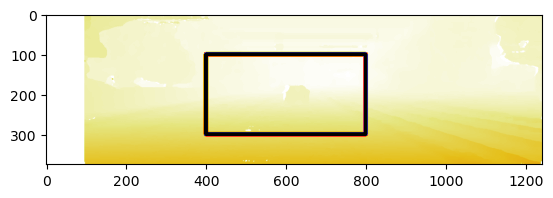

In [10]:
squared = disparity_left.copy()

cv2.rectangle(squared, pt1=(400,100), pt2=(800,300), color=(255,0,0), thickness=10)
plt.imshow(squared, cmap="CMRmap_r")

print(disparity_left[100:300, 400:800])

<p>
The disparity map is the size of the image.

At the location of each pixel, you get the distance in pixel to travel to get the correspondance in the other image.

<ul>
  <li>Objects that are far away are smaller in pixels, and the disparity value will be lower</li>
  <li>Close objects will appear at different angles and thus need a higher disparity value</li>
</ul>
From now on, we'll only focus on the image "disparity left".
</p>

<h3><b>Step 3 - Get Projection Matrices</b></h3>

In [11]:
print("Calibration file for image: ", open(calib_files[index]))
print(open(calib_files[index]).read())

Calibration file for image:  <_io.TextIOWrapper name='data/calib/000009.txt' mode='r' encoding='UTF-8'>
P0: 7.215377000000e+02 0.000000000000e+00 6.095593000000e+02 0.000000000000e+00 0.000000000000e+00 7.215377000000e+02 1.728540000000e+02 0.000000000000e+00 0.000000000000e+00 0.000000000000e+00 1.000000000000e+00 0.000000000000e+00
P1: 7.215377000000e+02 0.000000000000e+00 6.095593000000e+02 -3.875744000000e+02 0.000000000000e+00 7.215377000000e+02 1.728540000000e+02 0.000000000000e+00 0.000000000000e+00 0.000000000000e+00 1.000000000000e+00 0.000000000000e+00
P2: 7.215377000000e+02 0.000000000000e+00 6.095593000000e+02 4.485728000000e+01 0.000000000000e+00 7.215377000000e+02 1.728540000000e+02 2.163791000000e-01 0.000000000000e+00 0.000000000000e+00 1.000000000000e+00 2.745884000000e-03
P3: 7.215377000000e+02 0.000000000000e+00 6.095593000000e+02 -3.395242000000e+02 0.000000000000e+00 7.215377000000e+02 1.728540000000e+02 2.199936000000e+00 0.000000000000e+00 0.000000000000e+00 1.00

The following lines will help us parse the dataset to collect desired information.

Note: We are skipping P0 and P1 as they represent grayscale data.

In [12]:
def get_calibration_parameters(file):
    with open(file, 'r') as f:
        fin = f.readlines()
        for line in fin:
            if line[:2] == 'P2':
                p_left = np.array(line[4:].strip().split(" ")).astype('float32').reshape(3,-1)
            elif line[:2] == 'P3':
                p_right = np.array(line[4:].strip().split(" ")).astype('float32').reshape(3,-1)
            elif line[:7] == 'R0_rect':
                p_ro_rect = np.array(line[9:].strip().split(" ")).astype('float32').reshape(3,-1)
            elif line[:14] == 'Tr_velo_to_cam':
                p_velo_to_cam = np.array(line[16:].strip().split(" ")).astype('float32').reshape(3,-1)
            elif line[:14] == 'Tr_imu_to_velo':
                p_imu_to_velo = np.array(line[16:].strip().split(" ")).astype('float32').reshape(3,-1)
    return p_left, p_right, p_ro_rect, p_velo_to_cam, p_imu_to_velo

p_left, p_right, p_ro_rect, p_velo_to_cam, p_imu_to_velo = get_calibration_parameters(calib_files[index])

np.set_printoptions(precision=5)
print("Left P Matrix")
print(p_left)
print("Right P Matrix")
print(p_right)
print("RO to Rect Matrix")
print(p_ro_rect)
print("Velodyne to Camera Matrix")
print(p_velo_to_cam)
print("IMU to Velodyne Matrix")
print(p_imu_to_velo)

Left P Matrix
[[7.21538e+02 0.00000e+00 6.09559e+02 4.48573e+01]
 [0.00000e+00 7.21538e+02 1.72854e+02 2.16379e-01]
 [0.00000e+00 0.00000e+00 1.00000e+00 2.74588e-03]]
Right P Matrix
[[ 7.21538e+02  0.00000e+00  6.09559e+02 -3.39524e+02]
 [ 0.00000e+00  7.21538e+02  1.72854e+02  2.19994e+00]
 [ 0.00000e+00  0.00000e+00  1.00000e+00  2.72991e-03]]
RO to Rect Matrix
[[ 0.99992  0.00984 -0.00745]
 [-0.00987  0.99994 -0.00428]
 [ 0.0074   0.00435  0.99996]]
Velodyne to Camera Matrix
[[ 7.53374e-03 -9.99971e-01 -6.16602e-04 -4.06977e-03]
 [ 1.48025e-02  7.28073e-04 -9.99890e-01 -7.63162e-02]
 [ 9.99862e-01  7.52379e-03  1.48076e-02 -2.71781e-01]]
IMU to Velodyne Matrix
[[ 9.99998e-01  7.55307e-04 -2.03583e-03 -8.08676e-01]
 [-7.85403e-04  9.99890e-01 -1.48230e-02  3.19556e-01]
 [ 2.02441e-03  1.48245e-02  9.99888e-01 -7.99723e-01]]


<h3><b>Step 4 - Compute the Depth Map</b></h3>

A depth map is a map that contains, for each pixel, the depth information.

How to get depth information?

From our formulas, we defined the following:
<img src='./step4.png'/>
It's clear now... We have:
<ul>
<li>The focal length, f</li>
<li>The baseline, b</li>
<li>The disparity value, for each pixel</li>
👉 The depth map is a map that contains Z for each pixel

In [13]:
def decompose_projection_matrix(p):
    k, r, t, _, _, _, _ = cv2.decomposeProjectionMatrix(p)
    t = t / t[3] # Back from homogeneous
    return k, r, t

# Decompose each matrix
k_left, r_left, t_left = decompose_projection_matrix(p_left)
k_right, r_right, t_right = decompose_projection_matrix(p_right)

# Display the matrices
print("k_left \n", k_left)
print("\nr_left \n", r_left)
print("\nt_left \n", t_left)
print("\nk_right \n", k_right)
print("\nr_right \n", r_right)
print("\nt_right \n", t_right)

k_left 
 [[721.5377   0.     609.5593]
 [  0.     721.5377 172.854 ]
 [  0.       0.       1.    ]]

r_left 
 [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]

t_left 
 [[-5.98493e-02]
 [ 3.57927e-04]
 [-2.74588e-03]
 [ 1.00000e+00]]

k_right 
 [[721.5377   0.     609.5593]
 [  0.     721.5377 172.854 ]
 [  0.       0.       1.    ]]

r_right 
 [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]

t_right 
 [[ 0.47286]
 [-0.00239]
 [-0.00273]
 [ 1.     ]]


In [14]:
def calc_depth_map(disp_left, k_left, t_left, t_right):
    # Get the focal length from the K matrix
    f = k_left[0, 0]
    # Get the distance between the cameras from the t matrices (baseline)
    b = abs(t_left[0] - t_right[0]) #On the setup page, you can see 0.54 as the distance between the two color cameras (http://www.cvlibs.net/datasets/kitti/setup.php)
    # Replace all instances of 0 and -1 disparity with a small minimum value (to avoid div by 0 or negatives)
    disp_left[disp_left == 0] = 0.1
    disp_left[disp_left == -1] = 0.1
    # Initialize the depth map to match the size of the disparity map
    depth_map = np.ones(disp_left.shape, np.single)
    # Calculate the depths
    depth_map[:] = f * b / disp_left[:]
    return depth_map

# Get the depth map by calling the above function
depth_map_left = calc_depth_map(disparity_left, k_left, t_left, t_right)
depth_map_right = calc_depth_map(disparity_right, k_right, t_right, t_left)

Text(0.5, 1.0, 'Depth Right')

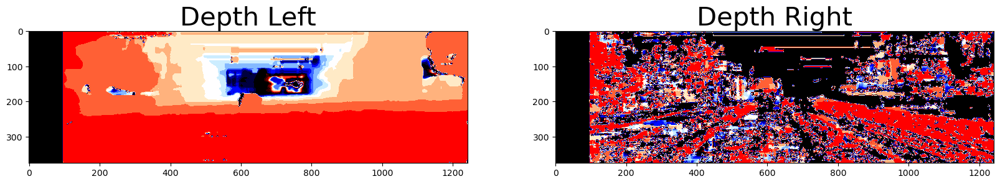

In [15]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(depth_map_left,cmap='flag') # or flag
ax1.set_title('Depth Left', fontsize=30)
ax2.imshow(depth_map_right,cmap='flag') # or flag
ax2.set_title('Depth Right', fontsize=30)

In [16]:
np.save('output/depth_map.npy', depth_map_left)


<h3><b>Step 5 - Find the Bounding Boxes</b></h3>

In [17]:
!pip uninstall torch torchvision torchaudio -y
!pip cache purge
!pip install --upgrade pip setuptools wheel
!pip install --upgrade torch torchvision torchaudio ultralytics

Found existing installation: torch 2.5.1
Uninstalling torch-2.5.1:
  Successfully uninstalled torch-2.5.1
Found existing installation: torchvision 0.20.1
Uninstalling torchvision-0.20.1:
  Successfully uninstalled torchvision-0.20.1
Found existing installation: torchaudio 2.5.1
Uninstalling torchaudio-2.5.1:
  Successfully uninstalled torchaudio-2.5.1
Files removed: 42
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 MB 7.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 6.5 MB/s eta 0:00:00a 0:00:01



0: 224x640 1 car, 49.5ms
Speed: 2.6ms preprocess, 49.5ms inference, 6.8ms postprocess per image at shape (1, 3, 224, 640)
Execution time: 1138.64 ms


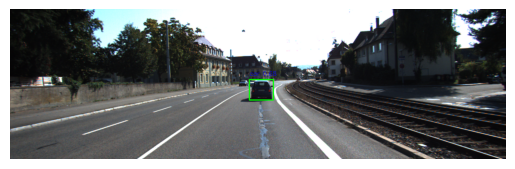

In [17]:
from ultralytics import YOLO
import time

# Load your custom YOLO model
model = YOLO("Yolov4/yolov8n.pt")  # Replace with your model's path

def run_obstacle_detection(img):
    """
    Runs obstacle detection using the Ultralytics YOLO model.
    Args:
        img: Input image in BGR format.
    Returns:
        result: Image with drawn bounding boxes.
        pred_bboxes: List of predicted bounding boxes [x_min, y_min, x_max, y_max].
    """
    start_time = time.time()

    # Convert BGR to RGB for YOLO inference
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Perform inference
    results = model.predict(img_rgb, conf=0.4, iou=0.35)  # Adjust thresholds as needed

    # Extract predictions
    boxes = results[0].boxes.xyxy.cpu().numpy()  # Bounding boxes (x_min, y_min, x_max, y_max)
    confs = results[0].boxes.conf.cpu().numpy()  # Confidence scores
    cls_ids = results[0].boxes.cls.cpu().numpy()  # Class IDs

    # Draw bounding boxes on the original image
    for box, conf, cls_id in zip(boxes, confs, cls_ids):
        x_min, y_min, x_max, y_max = map(int, box)
        label = f"{model.names[int(cls_id)]} {conf:.2f}"  # Class name and confidence score

        # Draw the rectangle
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=2)

        # Draw the label
        cv2.putText(img, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    fontScale=0.5, color=(255, 0, 0), thickness=1)

    exec_time = time.time() - start_time
    print(f"Execution time: {exec_time * 1000:.2f} ms")

    # Package bounding boxes for further processing
    pred_bboxes = boxes  # [x_min, y_min, x_max, y_max]

    return img, pred_bboxes

# Example usage
result, pred_bboxes = run_obstacle_detection(img_left)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
plt.axis("off")
plt.show()


In [18]:
cv2.imwrite("output/result_yolo.png", result)

True

<h3><b>Let's take a minute and analyze YOLOv4 output</b></h3>

In [19]:
h, w, _ = img_left.shape
testing_box = pred_bboxes[0]
print("original box", testing_box)
print("center_x:",testing_box[0]*w)
print("center_y",testing_box[1]*h)
print("width:", testing_box[2]*w)
print("height:",testing_box[3]*h)

for box in pred_bboxes:
    print(int(box[1]+(box[3]-box[1])/2),int(box[0]+(box[2]-box[0])/2))

original box [     599.73      176.74      659.28      227.99]
center_x: 744870.2453613281
center_y 66276.59797668457
width: 818830.7237548828
height: 85497.48802185059
202 629


In [20]:
def find_distances(depth_map, pred_bboxes, img, method="center"):
    """
    Go through each bounding box and take a point in the corresponding depth map.
    It can be:
    * The Center of the box
    * The average value
    * The minimum value (closest point)
    * The median of the values
    """
    depth_list = []
    h, w, _ = img.shape
    for box in pred_bboxes:
        x1 = int(box[0]) # center_x - width /2
        y1 = int(box[1]) # center_y - height /2
        x2 = int(box[2]) # center_x + width/2
        y2 = int(box[3]) # center_y + height/2
        #print(np.array([x1, y1, x2, y2]))
        obstacle_depth = depth_map[y1:y2, x1:x2]
        if method=="closest":
            depth_list.append(obstacle_depth.min()) # take the closest point in the box
        elif method=="average":
            depth_list.append(np.mean(obstacle_depth)) # take the average
        elif method=="median":
            depth_list.append(np.median(obstacle_depth)) # take the median
        else:
            depth_list.append(depth_map[int(box[1]+(box[3]-box[1])/2)][int(box[0]+(box[2]-box[0])/2)]) # take the center
    return depth_list

depth_list = find_distances(depth_map_left, pred_bboxes, img_left, method="center")
print(depth_list)

[22.777582]


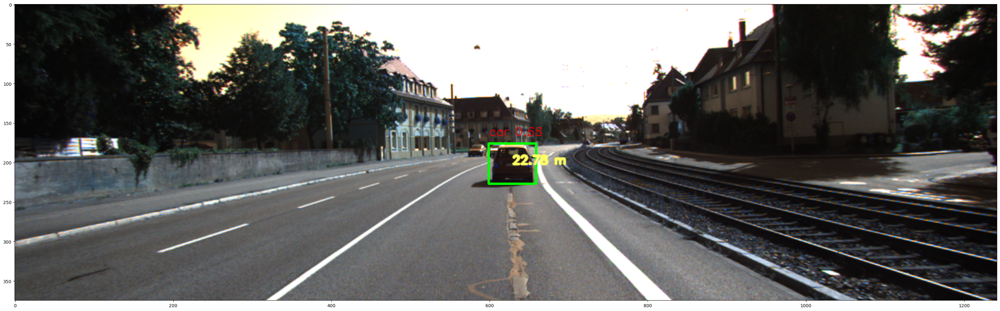

In [21]:
def add_depth(depth_list, result, pred_bboxes):
    h, w, _ = result.shape
    res = result.copy()
    for i, distance in enumerate(depth_list):
        cv2.putText(res, '{0:.2f} m'.format(distance), (int(pred_bboxes[i][0]+(pred_bboxes[i][2]-pred_bboxes[i][0])/2),int(pred_bboxes[i][1]+(pred_bboxes[i][3]-pred_bboxes[i][1])/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 100), 2, cv2.LINE_AA)
    return res

res = add_depth(depth_list, result, pred_bboxes)

plt.figure(figsize = (40,20))
plt.imshow(res)
#cv2.imwrite("output/result.png", cv2.cvtColor(res, cv2.COLOR_BGR2RGB))

<h3><b>Compare with the Ground Truth (Labels)</b></h3>

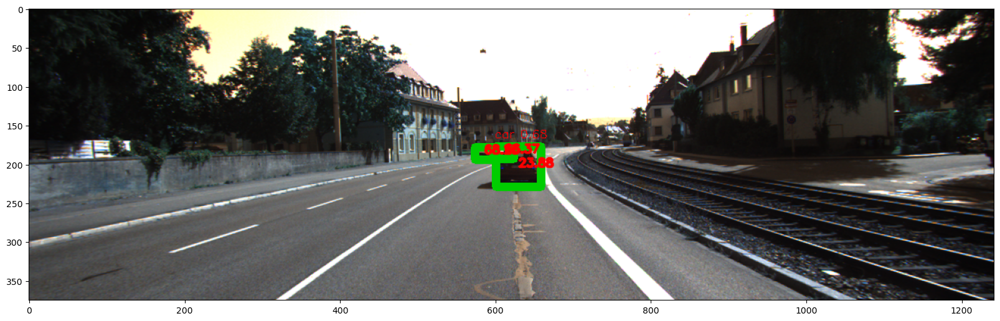

In [22]:
def ground_truth_display(img_label, index):
    with open(labels[index], 'r') as f:
            fin = f.readlines()
            for line in fin:
                if line.split(" ")[0] != "DontCare":
                    #print(line)
                    x1_value = int(float(line.split(" ")[4]))
                    y1_value = int(float(line.split(" ")[5]))
                    x2_value = int(float(line.split(" ")[6]))
                    y2_value = int(float(line.split(" ")[7]))
                    distance = float(line.split(" ")[13])
                    cv2.rectangle(img_label, (x1_value, y1_value), (x2_value, y2_value), (0,205,0), 10)
                    cv2.putText(img_label, str(distance), (int((x1_value+x2_value)/2),int((y1_value+y2_value)/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2, cv2.LINE_AA)
    return img_label

img_label = img_left.copy()
img_label = ground_truth_display(img_label, index)
plt.figure(figsize=(20,40))
plt.imshow(img_label)
plt.show()

<h3><b>The Full Pipeline</b></h3>

In [23]:
def pipeline (img_left, img_right, p_left, p_right):
    "For a pair of 2 Calibrated Images"
    #Reading the Left Images
    img_left_gray = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
    # Reading the right Images
    img_right_gray = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)
    # Compute the Disparity Map
    disparity = compute_disparity(img_left_gray, img_pair=img_right_gray, num_disparities=112, block_size=5, window_size=7, matcher="stereo_sgbm", show_disparity=False)
    # Get the Calibration Parameters
    k_left, r_left, t_left = decompose_projection_matrix(p_left)
    k_right, r_right, t_right = decompose_projection_matrix(p_right)
    # Compute the Depth Map
    depth_map = calc_depth_map(disparity, k_left, t_left, t_right)
    # Run obstacle detection in 2D
    result, pred_bboxes = run_obstacle_detection(img_left)
    # Find the Distance
    depth_list = find_distances(depth_map, pred_bboxes, img_left)
    # Final Image
    final = add_depth(depth_list, result, pred_bboxes)
    return final,disparity,depth_map


0: 224x640 6 cars, 1 truck, 63.8ms
Speed: 3.8ms preprocess, 63.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 640)
Execution time: 84.39 ms


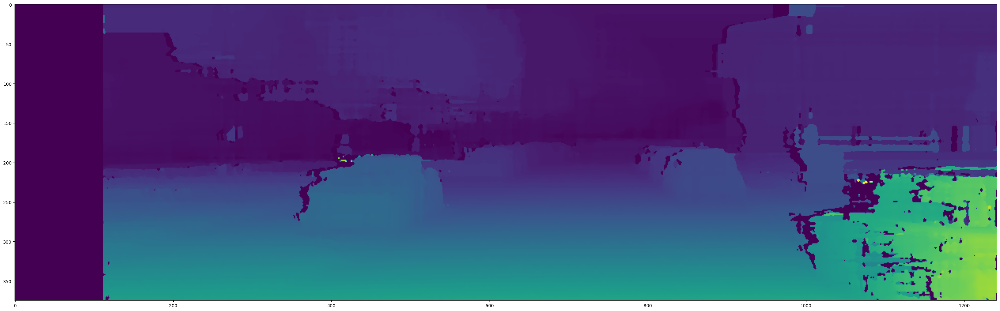

In [66]:
index  = 3
img_left = cv2.imread(images_L[index])
img_right = cv2.imread(images_R[index])
p_left, p_right, p_ro_rect, p_velo_to_cam, p_imu_to_velo = get_calibration_parameters(calib_files[index])

final,disparity,depth_map_color = pipeline(img_left, img_right, p_left, p_right)
plt.figure(figsize = (40,20))
plt.imshow(disparity)
plt.show()

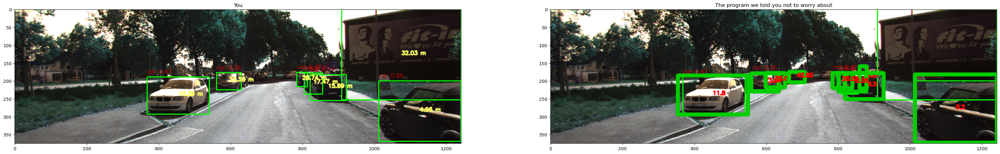

In [36]:
ground_truth = ground_truth_display(img_left, index)

f, (ax1, ax2) = plt.subplots(1,2, figsize=(40,20))
ax1.set_title("You")
ax1.imshow(final)
ax2.set_title("The program we told you not to worry about")
ax2.imshow(ground_truth)
plt.show()

<h3><b>3D Bounding Boxes</b></h3>
We have the distance! As you noticed, it's very sensitive to:
<ul>
  <li>The Calibration Parameters (Intrinsics & Extrinsics)</li>
  <li>The Setup (Baseline, ...)</li>
  <li>The Stereo Matching Algorithm (SGBM here)</li>

In [35]:
"""
I'm cloning this awesome repository for 3D Bounding Boxes.
This will be used to get our ground truth.
License is open to use.
"""
# !git clone https://github.com/darylclimb/cvml_project.git


import sys
!pip install open3d
!pip install mayavi
!pip install PyQt5
!pip install numpy scipy
!pip install vtk==9.2.2  # Specific version may resolve issues

# !mv cvml_project/projections/lidar_camera_projection .
# !rm -rf cvml_project
# print(cv2.__version__)
# !ls
!python3 lidar_camera_projection/lidar_camera_project.py --img "/content/drive/My Drive/Think Autonomous/SDC Course/Stereo Vision/data/left/000007.png" --calib "/content/drive/My Drive/Think Autonomous/SDC Course/Stereo Vision/data/calib/000007.txt" --label "/content/drive/My Drive/Think Autonomous/SDC Course/Stereo Vision/data/labels/000007.txt" --bin "/content/drive/My Drive/Think Autonomous/SDC Course/Stereo Vision/data/bin/000007.bin"

  Using cached mayavi-4.8.2.tar.gz (7.1 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached apptools-5.3.0-py3-none-any.whl.metadata (4.3 kB)
  Using cached envisage-7.0.3-py3-none-any.whl.metadata (5.2 kB)
  Using cached pyface-8.0.0-py3-none-any.whl.metadata (7.7 kB)
  Using cached traits-6.4.3-cp311-cp311-macosx_10_9_universal2.whl.metadata (5.0 kB)
  Using cached traitsui-8.0.0-py3-none-any.whl.metadata (6.8 kB)
  Using cached vtk-9.4.0-cp311-cp311-macosx_11_0_arm64.whl.metadata (5.2 kB)
Using cached pyface-8.0.0-py3-none-any.whl (1.3 MB)
Using cached traits-6.4.3-cp311-cp311-macosx_10_9_universal2.whl (5.0 MB)
Using cached traitsui-8.0.0-py3-none-any.whl (1.5 MB)
Using cached apptools-5.3.0-py3-none-any.whl (230 kB)
Using cached envisage-7.0.3-py3-none-any.whl (268 kB)
Using cached vtk-9.4.0-cp311-cp311-macosx_11_0_arm64.whl (76.8 MB)
  error: subprocess-exited-with-error
  
  × B

<h3><b>Build a 3D Point Cloud (3D Reconstruction)</b></h3>
<img src='./step5.png'/>

<p>OpenCV uses the Q Matrix is used to get a 3D Point Cloud. If you've done the calibration notebook, you saw this Q matrix as "disparity to depth".

Structure of the Q Matrix:

<img src='./formula.png'/>

It is obstained through stereo calibration, in particular, the function

<code>Q = np.zeros(4,4)
cv2. stereoRectify (cameraMatrixLeft, CameraMatrixRight, distortion_coefficients_left, distortion_coefficients_right, image_size, R, T, R1, R2, P1, P2, Q) </code>

Then, StereoRectify modifies the Q matrix.

It then can be used the following:

<img src='./formula2.png'/>
</p>

In [36]:
# Calculate depth-to-disparity
cam1 = p_left[:,:3] # left image - P2
cam2 = p_right[:,:3] # right image - P3

print(p_left)
print(cam1)

Tmat = np.array([0.54, 0., 0.]) #On the setup page, you can see 0.54 as the distance between the two color cameras (http://www.cvlibs.net/datasets/kitti/setup.php)

Q = np.zeros((4,4))

cv2.stereoRectify(cameraMatrix1 = cam1,cameraMatrix2 = cam2, \
                  distCoeffs1 = 0, distCoeffs2 = 0, \
                  imageSize = img_left.shape[:2], \
                  R = np.identity(3), T = Tmat, \
                  R1 = None, R2 = None, \
                  P1 =  None, P2 =  None, Q = Q);

print("Disparity To Depth")
print(Q)

[[     721.54           0      609.56      44.857]
 [          0      721.54      172.85     0.21638]
 [          0           0           1   0.0027459]]
[[     721.54           0      609.56]
 [          0      721.54      172.85]
 [          0           0           1]]
Disparity To Depth
[[          1           0           0     -609.56]
 [          0           1           0     -172.85]
 [          0           0           0      721.54]
 [          0           0     -1.8519           0]]


In [37]:
points = cv2.reprojectImageTo3D(disparity_left.copy(), Q)


#reflect on x axis

reflect_matrix = np.identity(3)
reflect_matrix[0] *= -1
points = np.matmul(points,reflect_matrix)


#extract colors from image
#img_left_color = cv2.cvtColor(img_left, cv2.COLOR_BGR2RGB)
#colors = cv2.cvtColor(img_left_color, cv2.COLOR_BGR2RGB)
img_left = cv2.imread(images_L[index])
colors = cv2.cvtColor(img_left.copy(),cv2.COLOR_BGR2RGB)

#filter by min disparity
mask = disparity_left > disparity_left.min()
out_points = points[mask]
out_colors = colors[mask]

#filter by dimension
#idx = np.fabs(out_points[:,0]) < 4.5
#out_points = out_points[idx]
out_colors = out_colors.reshape(-1, 3)
#out_colors = out_colors[idx]

In [38]:
def write_ply(fn, verts, colors):
    ply_header = '''ply
    format ascii 1.0
    element vertex %(vert_num)d
    property float x
    property float y
    property float z
    property uchar red
    property uchar green
    property uchar blue
    end_header
    '''
    out_colors = colors.copy()
    verts = verts.reshape(-1, 3)
    verts = np.hstack([verts, out_colors])
    with open(fn, 'wb') as f:
        f.write((ply_header % dict(vert_num=len(verts))).encode('utf-8'))
        np.savetxt(f, verts, fmt='%f %f %f %d %d %d ')

file_name = "output/out"+str(index)+".ply"
write_ply(file_name, out_points, out_colors)


<h3><b>Video Recognition</b></h3>
If you want something really impressive to recruiters, the best thing to have is a video.

On the dataset: <a href='http://www.cvlibs.net/datasets/kitti/raw_data.php'>http://www.cvlibs.net/datasets/kitti/raw_data.php</a>

Do it on other images:
Under "Raw Data", you can get access to the videos. Take rectified images, download the folder, and import it here. Then, start to run the video.

In [34]:
import cv2
import glob

# Get list of images for left and right videos
left_video = sorted(glob.glob("data/video/left/*.png"))
right_video = sorted(glob.glob("data/video/right/*.png"))

result_video = []
disparity_video = []
depth_video = []

# Process each pair of images
for idx in range(len(left_video)):
    left_img = cv2.imread(left_video[idx])
    right_img = cv2.imread(right_video[idx])

    # Assuming `pipeline` is a function that processes the frames
    result_frame, disparity,depth = pipeline(left_img, right_img, p_left, p_right)
    result_video.append(result_frame)

    # Normalize disparity to 8-bit range for video writing
    normalized_disp = cv2.normalize(disparity, None, 0, 255, cv2.NORM_MINMAX)
    disparity_video.append(np.uint8(normalized_disp))

    # Normalize depth to 8-bit range for video writing
    normalized_depth = cv2.normalize(depth, None, 0, 255, cv2.NORM_MINMAX)
    depth_video.append(np.uint8(normalized_depth))

# Get the dimensions of the frames
frame_height, frame_width, _ = result_video[0].shape
disparity_height, disparity_width = disparity_video[0].shape
depth_height, depth_width = depth_video[0].shape

# Initialize the VideoWriter for the result video
out_result = cv2.VideoWriter(
    'output/vid.mp4',
    cv2.VideoWriter_fourcc(*'mp4v'),
    15,
    (frame_width, frame_height)
)

# Initialize the VideoWriter for the disparity video
out_disparity = cv2.VideoWriter(
    'output/disparity.mp4',
    cv2.VideoWriter_fourcc(*'mp4v'),
    15,
    (disparity_width, disparity_height),
    isColor = True
)

# Initialize the VideoWriter for the disparity video
out_depth = cv2.VideoWriter(
    'output/depth.mp4',
    cv2.VideoWriter_fourcc(*'mp4v'),
    15,
    (depth_width, depth_height),
    isColor=True
)

# Write frames to the result video
for frame in result_video:
    out_result.write(frame)  # Assuming `frame` is in BGR format

# Write frames to the disparity video
for frame in disparity_video:
    # Convert to 3-channel grayscale (optional for better visualization)
    # disparity_frame = cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR)
    # Apply color map (e.g., JET)
    color_frame = cv2.applyColorMap(frame, cv2.COLORMAP_OCEAN)

    # Write the color-mapped frame
    out_disparity.write(color_frame)

# Write frames to the disparity video
for frame in depth_video:
    # Convert to 3-channel grayscale (optional for better visualization)
    color_frame = cv2.applyColorMap(frame, cv2.COLORMAP_HOT)

    # Write the color-mapped frame
    out_depth.write(color_frame)

# Release the VideoWriter
out_result.release()
out_disparity.release()
out_depth.release()

print("Videos saved: output/out.mp4 and output/out2.mp4")



0: 256x640 1 car, 1 traffic light, 57.4ms
Speed: 1.4ms preprocess, 57.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 640)
Execution time: 64.58 ms

0: 256x640 1 car, 1 traffic light, 50.8ms
Speed: 1.2ms preprocess, 50.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 640)
Execution time: 56.40 ms

0: 256x640 1 car, 1 traffic light, 49.0ms
Speed: 1.0ms preprocess, 49.0ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 640)
Execution time: 53.82 ms

0: 256x640 1 car, 1 traffic light, 65.2ms
Speed: 2.4ms preprocess, 65.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 640)
Execution time: 71.28 ms

0: 256x640 1 car, 1 traffic light, 40.0ms
Speed: 1.2ms preprocess, 40.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 640)
Execution time: 45.36 ms

0: 256x640 1 car, 1 traffic light, 47.0ms
Speed: 1.2ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 640)
Execution time: 50.81 ms

0: 256x64

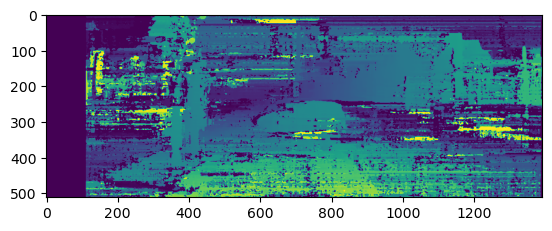

In [68]:
plt.imshow(disparity_video[0])